In [54]:
import os
os.environ["MKL_SERVICE_FORCE_INTEL"] = "1"
import numpy as np
import pandas as pd
# from pathlib import Path
# import tarfile
import matplotlib.pyplot as plt

from nilearn import plotting, image, connectome
# from nilearn.maskers import NiftiSpheresMasker
# from nilearn.connectome import ConnectivityMeasure
# import nibabel as nib
import plotly.graph_objects as go
from collections import defaultdict
import altair as alt
from atlasreader.atlasreader import read_atlas_peak


# from sklearn.covariance import GraphicalLassoCV

## Setup

Reading and loading the data for each subject into the array subject called `all_data`. This is an array subject with the shape of (1003, 4800, 15), which 1003 is the number of subject, 4800 is the number of data we have, and 15 is the number of brain region.

In [40]:
#loading the data

# MAKE SURE YOUR PATHS ARE CORRECT HERE!!!
dir_paths = {15: "HCP_PTN1200/node_timeseries_d15/3T_HCP1200_MSMAll_d15_ts2",
             50: "HCP_PTN1200/node_timeseries_d50/3T_HCP1200_MSMAll_d50_ts2",
             100: "HCP_PTN1200/node_timeseries_d100/3T_HCP1200_MSMAll_d100_ts2"}
brain_r = 15
sub_list = os.listdir(dir_paths[brain_r])
make_path = lambda x: dir_paths[brain_r] + "/" + x

paths = [make_path(i) for i in sub_list]
sub_data = [np.loadtxt(path) for path in paths]
all_data = np.array(sub_data)

In [41]:
all_data.shape

(1003, 4800, 15)

In [95]:
#Correlation Matrices per subject

data = []
for i in np.arange(len(sub_data)):
    data.append(np.corrcoef(sub_data[i].T))

### Preperation for the brain region
After testing each reference for atlases, We discover that the one from `harvard_oxford` is the most comprehensive and suitable for our project

In [9]:
"""
available reference atlases
---------------------------
    "aal",
    "aicha",
    "desikan_killiany",
    "destrieux",
    "harvard_oxford",
    "juelich",
    "marsatlas",
    "neuromorphometrics",
    "talairach_ba",
    "talairach_gyrus",
 """

atlas = image.threshold_img(f"HCP_PTN1200/groupICA/groupICA_3T_HCP1200_MSMAll_d{brain_r}.ica/melodic_IC_sum.nii.gz", "99.5%") 
atlas_coords = plotting.find_probabilistic_atlas_cut_coords(atlas)
brain_region = []
print("BRAIN REGIONS:\n--------------")
for atlas_coord in atlas_coords:
    region = read_atlas_peak("harvard_oxford", atlas_coord)
    print(region)
    brain_region += [region]

BRAIN REGIONS:
--------------
[[np.float64(47.0), 'Right_Occipital_Pole'], [np.float64(23.0), 'Right_Lateral_Occipital_Cortex_superior_division']]
[[np.float64(90.0), 'Left_Lateral_Occipital_Cortex_superior_division']]
[[np.float64(73.0), 'Right_Occipital_Pole']]
[[np.float64(58.0), 'Right_Lateral_Occipital_Cortex_superior_division']]
[[np.float64(57.0), 'Left_Lateral_Occipital_Cortex_superior_division']]
[[np.float64(75.0), 'Left_Supramarginal_Gyrus_anterior_division'], [np.float64(8.0), 'Left_Supramarginal_Gyrus_posterior_division'], [np.float64(6.0), 'Left_Parietal_Operculum_Cortex']]
[[np.float64(56.0), 'Right_Angular_Gyrus'], [np.float64(29.0), 'Right_Lateral_Occipital_Cortex_superior_division']]
[[np.float64(8.0), 'Right_Occipital_Fusiform_Gyrus']]
[[np.float64(77.0), 'Right_Lateral_Occipital_Cortex_superior_division']]
[[np.float64(39.0), 'Left_Supramarginal_Gyrus_posterior_division'], [np.float64(31.0), 'Left_Angular_Gyrus']]
[[np.float64(37.0), 'Left_Postcentral_Gyrus'], [np.f

In [10]:
#select the correct region with largest probability given from the library
brain_region = [
    max(inner_list, key=lambda x: x[0])[-1] if inner_list else None for inner_list in brain_region
]
brain_region

['Right_Occipital_Pole',
 'Left_Lateral_Occipital_Cortex_superior_division',
 'Right_Occipital_Pole',
 'Right_Lateral_Occipital_Cortex_superior_division',
 'Left_Lateral_Occipital_Cortex_superior_division',
 'Left_Supramarginal_Gyrus_anterior_division',
 'Right_Angular_Gyrus',
 'Right_Occipital_Fusiform_Gyrus',
 'Right_Lateral_Occipital_Cortex_superior_division',
 'Left_Supramarginal_Gyrus_posterior_division',
 'Left_Postcentral_Gyrus',
 'Right_Supracalcarine_Cortex',
 'Left_Precentral_Gyrus',
 'Left_Angular_Gyrus',
 'Left_Precuneous_Cortex']

For graphical representation of our data we are loading the atlas on which to plot our point

In [11]:
#Setting up atlas coordinates

atlas = image.load_img(f"HCP_PTN1200/groupICA/groupICA_3T_HCP1200_MSMAll_d{brain_r}.ica/melodic_IC_sum.nii.gz")
atlas = image.threshold_img(atlas, "99.5%") 
print("atlas has shape", ["x", "y", "z", "region"], "=", atlas.shape)

atlas_coords = plotting.find_probabilistic_atlas_cut_coords(atlas)

atlas has shape ['x', 'y', 'z', 'region'] = (91, 109, 91, 15)


## Some Useful Function For Later

In [51]:
#lets check the 99.9 percentile
def percentile(cov_matrix, percentile=99.9):
    ''' 
    finds percentile

    Takes in:
    cov_matrix
    percentile = 99.9
    '''
    cov_matrix = np.array(cov_matrix)
    iu = np.triu_indices(brain_r, 1) #get the upper triangle and and offset it to not include the diagonal
    unique_cov = abs(cov_matrix[iu])
    threshold = np.percentile(unique_cov, percentile) #threshold for 99.9 percentile
    indices = np.where((cov_matrix >= threshold) & (cov_matrix <0.999))
    pairs = np.dstack(indices)
    unique_pairs = np.array(list({tuple(np.sort(row)) for row in pairs[0]}))
    strong_correlations = {(x, y):cov_matrix[x, y] for x, y in unique_pairs}
    return strong_correlations

In [13]:
def distance_between_coords(id1, id2):
    ''' 
    Uses the atlas to calculate the distance between two coordinates
    '''
    return np.sqrt(np.sum([(atlas_coords[id2] - atlas_coords[id1])**2]))

## EDA

#### One Subject

We first plot the correlation matrix for one subject to visualize the result. 

In [14]:
#pick one random subject (index 0 - 1002)
i = 0
#get data for one subject
X = sub_data[629]
X.shape #(data points, brain regions)

(4800, 15)

In [15]:
corr_matrix = np.corrcoef(X.T)

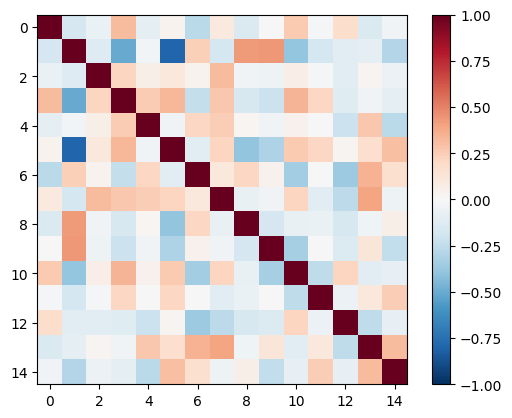

In [16]:
plt.imshow(corr_matrix, cmap='RdBu_r', vmin=-1, vmax=1)
plt.colorbar()

Connectivity Map will help us visualize which brain regions are highly correlated.

Note: Blue edges correspond to negative correlation, Red Edges correspond to positive correlation


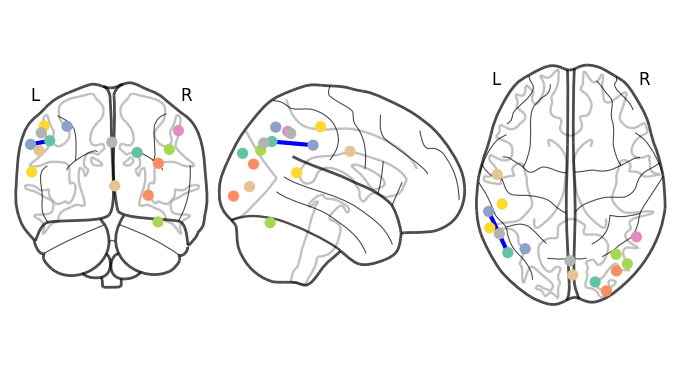

In [17]:
plotting.plot_connectome(corr_matrix, atlas_coords, edge_threshold="99.9%")

#### Aggregate Statistics

Getting the average squared correlation values

$$
c = \frac{1}{n}\sum_{i}\sum_{j}(x_{ij})^2
$$

In [18]:
#getting the average squared correlation values
sqr_corr = lambda corr_matrix: np.sum(corr_matrix.flatten()**2) / (len(corr_matrix) **2)

In [19]:
stats = []
for i in data:
    stats.append(sqr_corr(i))


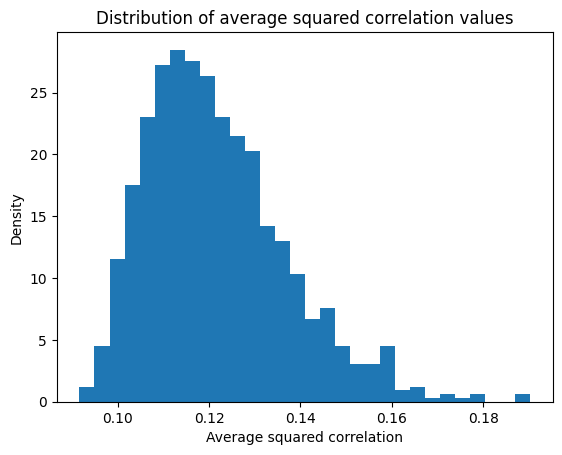

In [20]:
sqr_corr_plt = plt.hist(stats, bins=30, density=True)
plt.title("Distribution of average squared correlation values")
plt.xlabel("Average squared correlation")
plt.ylabel("Density")
plt.show()

In [21]:
std_corr = lambda corr_matrix: corr_matrix.flatten().std()

In [22]:
stats2= []
for i in data:
    stats2.append(std_corr(i))

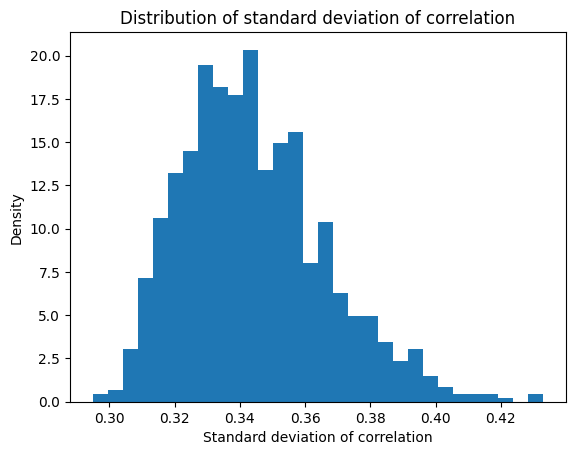

In [23]:
std_corr_plt = plt.hist(stats2, bins=30, density=True)
plt.title("Distribution of standard deviation of correlation")
plt.xlabel("Standard deviation of correlation")
plt.ylabel("Density")
plt.show()

#### Sliding Windows

In order to understand the structure of the dataset, we decided to explore and dig deeper into the details of the dataset. At first, we started using the time series data for individual subject.

The first one is the subject named after 100206.
We explore with the 5 mins as a window

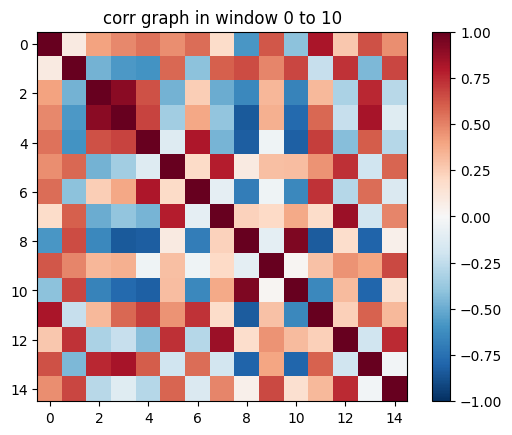

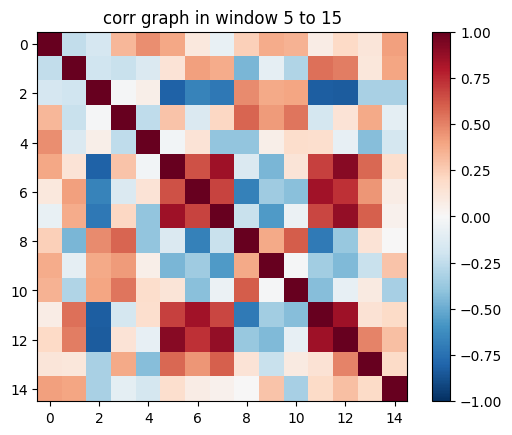

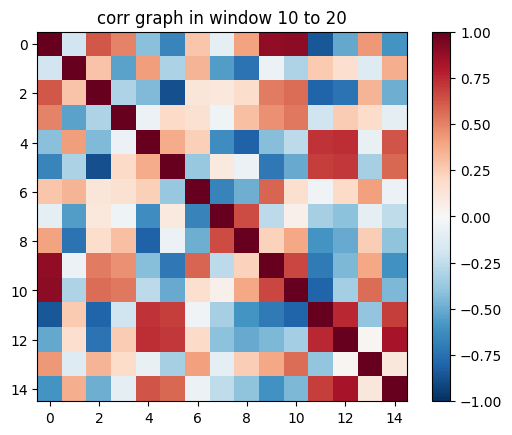

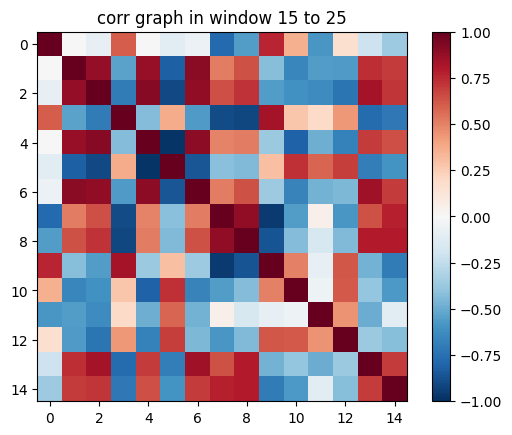

array([[  59.028  ,  -44.695  ,   18.952  ,   73.027  ,   13.956  ,
          12.397  ,   13.823  ,  -46.426  ,  -46.126  ,   14.543  ,
           3.8826 ,   35.199  ,  -89.774  ,    5.8966 ,  -65.148  ],
       [  27.747  ,  -54.463  ,   22.844  ,   99.64   ,    4.7734 ,
          13.866  ,   -7.2006 ,  -20.231  ,  -56.793  ,    7.9044 ,
           5.5889 ,   42.77   ,  -29.297  ,  -11.915  ,  -73.651  ],
       [  54.63   ,  -52.213  ,   56.765  ,  123.33   ,  -18.261  ,
          10.828  ,  -28.197  ,   28.644  ,  -68.649  ,   30.562  ,
           7.6382 ,   52.511  ,    4.8633 ,   14.036  ,  -46.136  ],
       [  58.521  ,   -2.1108 ,   64.59   ,   92.325  ,   -6.9285 ,
          24.104  ,  -21.775  ,   53.67   ,  -46.088  ,   35.609  ,
          -0.47412,   42.232  ,   56.675  ,    6.6367 ,  -36.264  ],
       [  72.271  ,   13.712  ,   10.469  ,   79.753  ,  -17.941  ,
          59.419  ,  -16.619  ,   59.956  ,  -15.411  ,   60.601  ,
          39.153  ,   65.588  ,   55.134  , 

In [ ]:
path_file = f'HCP_PTN1200/node_timeseries_d{brain_r}/3T_HCP1200_MSMAll_d{brain_r}_ts2/100206.txt'
dat = np.loadtxt(path_file, dtype=float)
dat.shape
count = 0
for i in range(dat.shape[0]):
    if count % 5 != 0:
        count += 1
        continue
    count += 1
    
    sub_dat = dat[i: i + 10]
    sub_corr_matrix = np.corrcoef(sub_dat.T)
    plt.imshow(sub_corr_matrix, cmap="RdBu_r", interpolation="none", vmin=-1, vmax=1)
    plt.colorbar()
    plt.title(f"corr graph in window {i} to {i+10}")
    plt.show()

    if i + 5 == 20:
        break

test_data = dat[0:10]
result = connectome.ConnectivityMeasure(test_data, kind = "tangent")
result.cov_estimator


To see the detail relationship of each region in the brain, we decided to use correlation matrix to see for each individual subject.

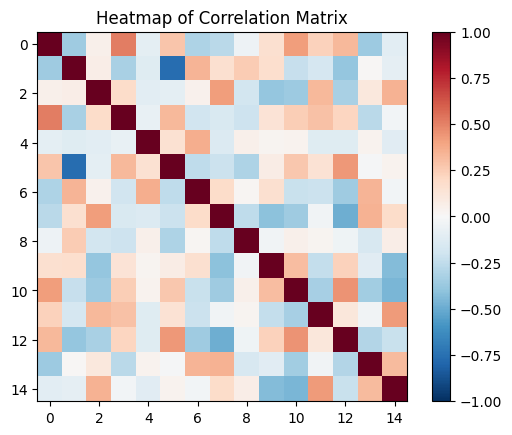

In [25]:
path_file = f'HCP_PTN1200/node_timeseries_d{brain_r}/3T_HCP1200_MSMAll_d{brain_r}_ts2/100206.txt'

data = np.loadtxt(path_file, dtype=float)
corr_matrix = np.corrcoef(data.T)
plt.imshow(corr_matrix, cmap='RdBu_r', interpolation='none', vmin=-1, vmax=1)
plt.colorbar()
plt.title('Heatmap of Correlation Matrix')
plt.show()

Now is the exploration for subject 100307

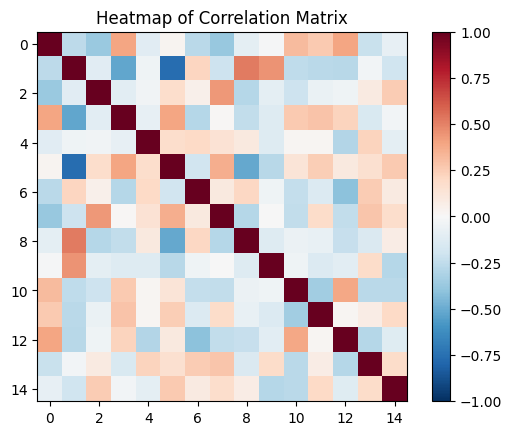

In [26]:
path_file = f'HCP_PTN1200/node_timeseries_d{brain_r}/3T_HCP1200_MSMAll_d{brain_r}_ts2/100307.txt'

data = np.loadtxt(path_file, dtype=float)
corr_matrix = np.corrcoef(data.T)
plt.imshow(corr_matrix, cmap='RdBu_r', interpolation='none', vmin=-1, vmax=1)
plt.colorbar()
plt.title('Heatmap of Correlation Matrix')
plt.show()

Subject 100408

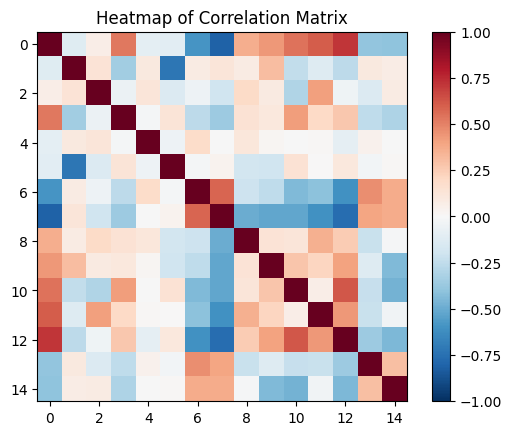

In [27]:
path_file = f'HCP_PTN1200/node_timeseries_d{brain_r}/3T_HCP1200_MSMAll_d{brain_r}_ts2/100408.txt'

data = np.loadtxt(path_file, dtype=float)
corr_matrix = np.corrcoef(data.T)
plt.imshow(corr_matrix, cmap='RdBu_r', interpolation='none', vmin=-1, vmax=1)
plt.colorbar()
plt.title('Heatmap of Correlation Matrix')
plt.show()

### Sliding Window Analysis

##### create sliding windows for all subject. 
a sliding window is that we intentionally make 50% overlap for each group we created

At first, we wish to see the general differences and changes for dynamic connections between regions in the brain. In order to start from the easy part, we fixed it into four windows


In [30]:
#copy the data and create prepration
dat = all_data
average_corr_matrices = []
time_per_group = dat.shape[1] // 4

#for loop to get sliding windows for each subject, then average them ahead and return 4 averaged correlation matrices divided by their windows
for group_idx in range(4):
    subject_corr_matrices = []
    #select group and window
    start_time = group_idx * time_per_group
    end_time = start_time + time_per_group
    sub_matrix = dat[:, start_time:end_time, :]
    #select the windows for each subject by looping through them
    for person_idx in range(dat.shape[0]):
        subgroup_dat = sub_matrix[person_idx, :, :]
        #calculate correlation matrix
        corr_matrix = np.corrcoef(subgroup_dat.T)
        #append it into the correlated array for each window
        subject_corr_matrices.append(corr_matrix)
    #took average
    average_corr_matrix = np.mean(subject_corr_matrices, axis=0)
    
    average_corr_matrices.append(average_corr_matrix)
    

average_corr_matrices = np.array(average_corr_matrices)

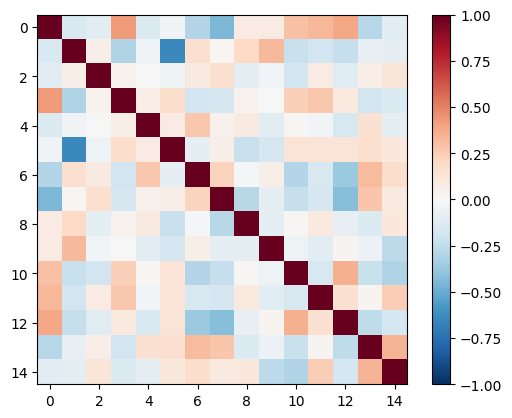

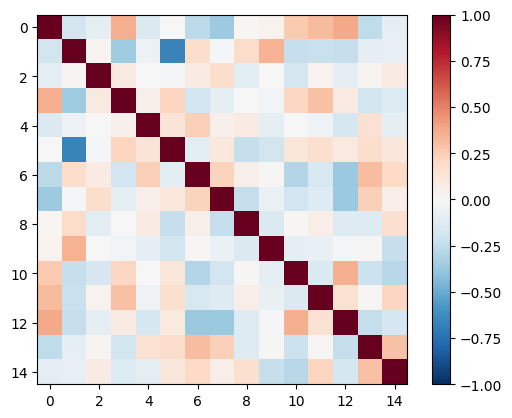

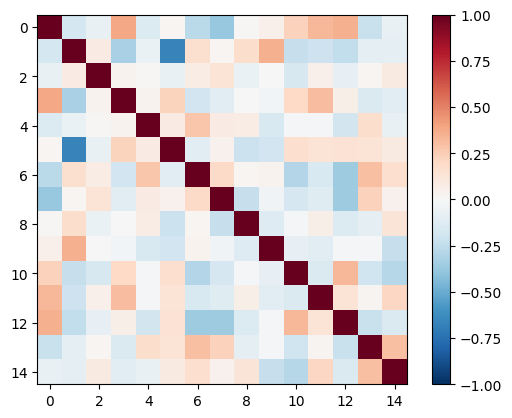

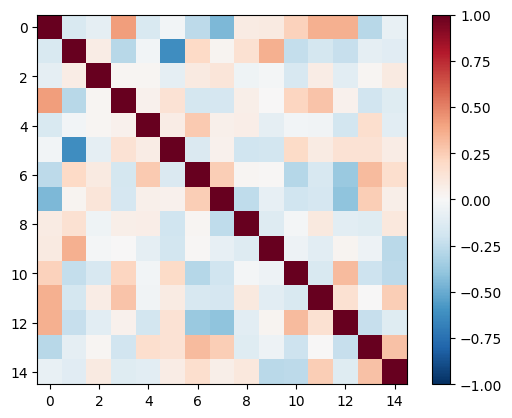

In [31]:
#using a for loop to plot the correlation matrix for each sliding window
for sub_corr_matrix in average_corr_matrices:
    plt.figure()
    plt.imshow(sub_corr_matrix, cmap="RdBu_r", interpolation="none", vmin = -1, vmax = 1)
    plt.colorbar()
    plt.show()

### Graph for sliding window correlation for all subjects

For this part, we decided to go for the bigger picture that we created a function that generates 7 sliding window correlation matrices as defualt for all regions. This function used 50% overlap for the sliding windows which helps us to see the dynamic connections clearly.

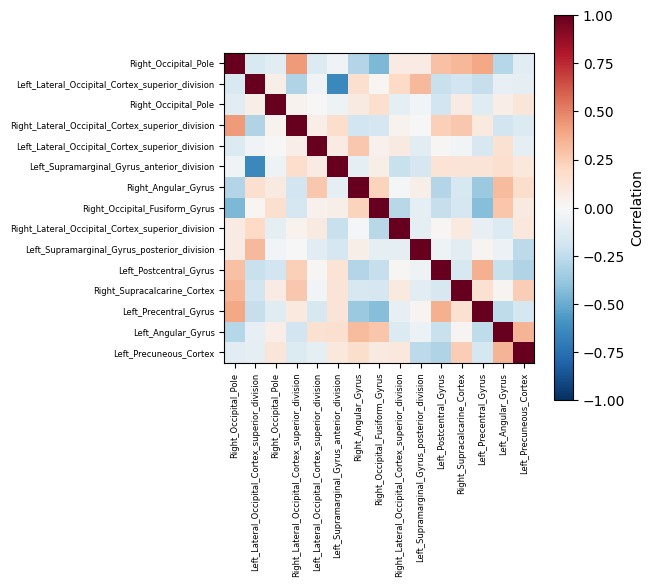

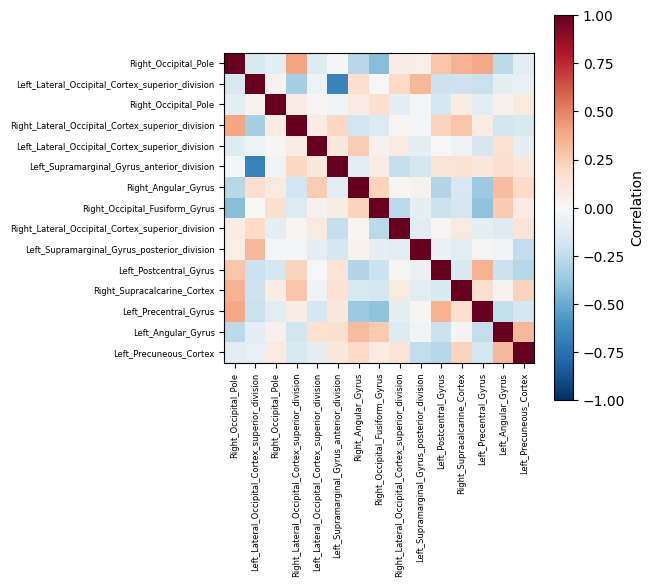

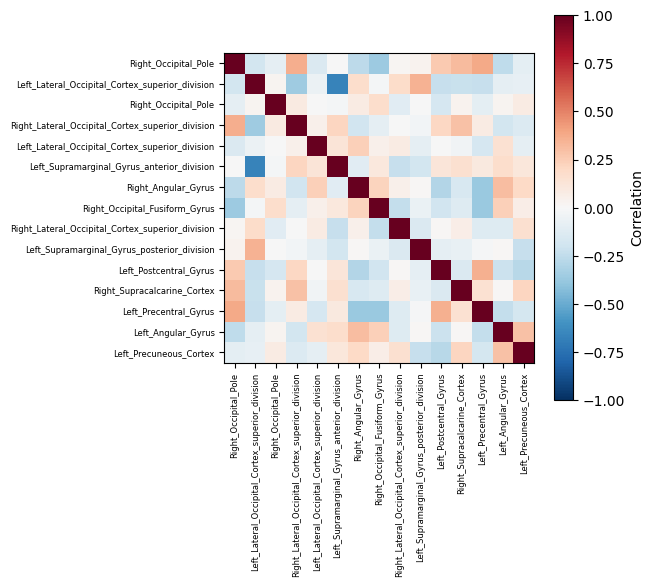

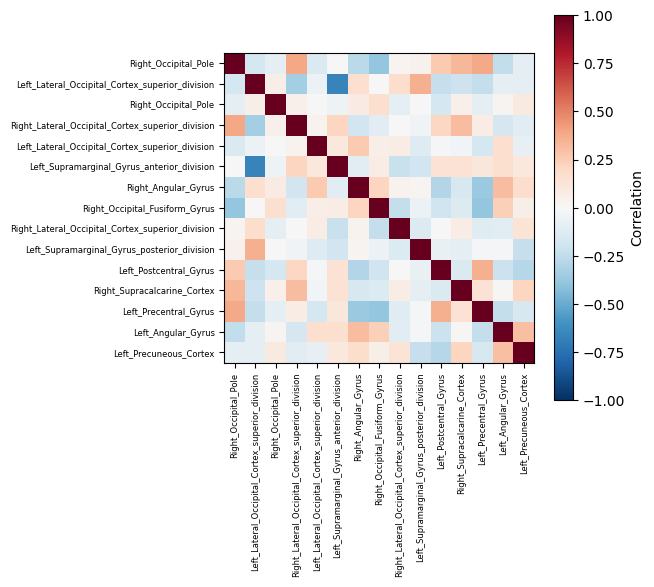

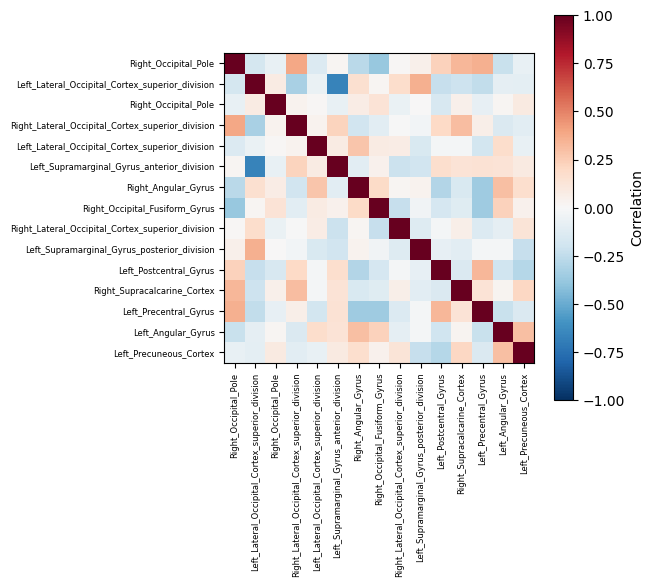

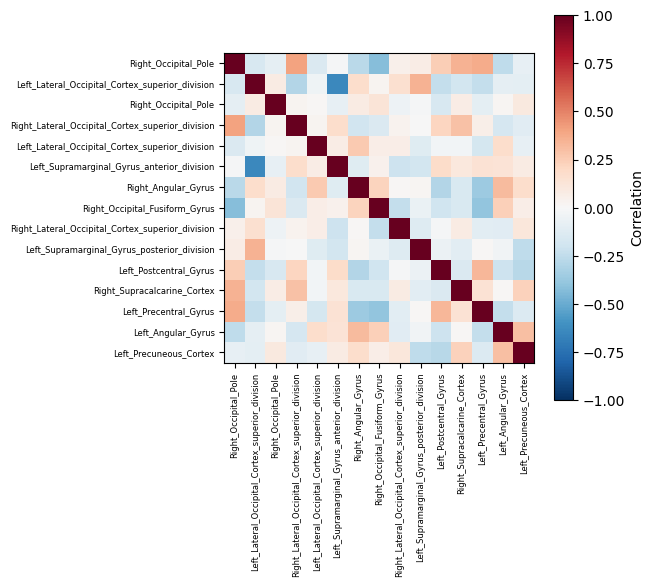

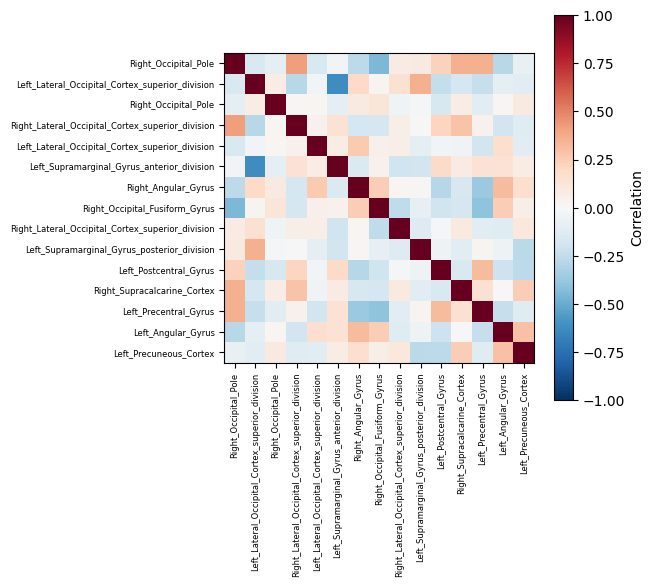

In [32]:
def sliding_window_corr(data, region=None,time_per_group=None, overlap=None):
    #defualt settings
    if time_per_group is None:
        time_per_group = data.shape[1] // 4 
    if overlap is None:
        overlap = time_per_group // 2 
    
    #setup for default 50% overlap
    num_windows = (data.shape[1] - overlap) // overlap
    
    average_corr_matrices_slid = []
    #looping through the data and seperate them into different windows
    for group_idx in range(num_windows):
        subject_corr_matrices_slid = []
        
        start_time = group_idx * overlap
        end_time = start_time + time_per_group
        
        sub_matrix = data[:, start_time:end_time, :]
        #looping through each subject and grouping them into different windows
        for person_idx in range(data.shape[0]):
            #cases for different condition (regions)
            if region is None:
                subgroup_data = sub_matrix[person_idx, :, :]
            else:
                subgroup_data = sub_matrix[person_idx, :, region[0]:region[-1]]
            #create correlation matrix
            corr_matrix = np.corrcoef(subgroup_data.T)
            subject_corr_matrices_slid.append(corr_matrix)
        
        average_corr_matrix_slid = np.mean(subject_corr_matrices_slid, axis=0)
        
        average_corr_matrices_slid.append(average_corr_matrix_slid)
    #adjust the region for plots
    if region is not None:
        ranged_brain_region = brain_region[region[0]:region[-1]]
    else:
        ranged_brain_region = brain_region

    average_corr_matrices_slid = np.array(average_corr_matrices_slid)
    #using plotting package to plot the correlation matrix for each sliding window
    for sub_corr_matrix in average_corr_matrices_slid:
        plt.figure(figsize=(5, 5))
        plt.imshow(sub_corr_matrix, cmap = "RdBu_r", vmin=-1, vmax=1);   
        plt.colorbar(label="Correlation")
        plt.xticks(ticks=np.arange(len(ranged_brain_region)), labels=ranged_brain_region, rotation=90, fontsize=6)
        plt.yticks(ticks=np.arange(len(ranged_brain_region)), labels=ranged_brain_region, fontsize=6)
        plt.show()
    #returing an array of result of shape of (7, 15, 15) along with the region labels
    return average_corr_matrices_slid, ranged_brain_region

   

dat = all_data
average_corr_matrices_slid_all = sliding_window_corr(dat)
average_corr_matrices_slid = average_corr_matrices_slid_all[0]
ranged_brain_region = average_corr_matrices_slid_all[1]


In order to dig more about the correlation matrix, we selected and extracted the top 5 brain region pairs for the sliding windows, and we wish to see if the regions that we get is reasonable. 

In [33]:
sliding_top_5_result = {}
count = 0

for matrix in average_corr_matrices_slid:
    #flatten the matrix and get the upper triangle indices
    upper_triangle_indices = np.triu_indices_from(matrix, k=1)
    values = matrix[upper_triangle_indices]

    # Get the top 5 values and their indices
    top_5_indices = np.argsort(values)[-5:]
    top_5_values = values[top_5_indices]
    top_5_row_indices, top_5_col_indices = upper_triangle_indices[0][top_5_indices], upper_triangle_indices[1][top_5_indices]
    top_5_row_indices = [brain_region[i] for i in top_5_row_indices]
    top_5_col_indices = [brain_region[i] for i in top_5_col_indices]


    # Display the results
    top_5_results = list(zip(top_5_row_indices, top_5_col_indices))
    sliding_top_5_result[count] = top_5_results
    count += 1


In [34]:
pair_count = defaultdict(int)

# Loop through each item in the dictionary
for pair_list in sliding_top_5_result.values():
    for pair in pair_list:
        pair_count[pair] += 1

# Sort and print the top 5 most frequent pairs
top_5_pairs = sorted(pair_count.items(), key=lambda x: x[1], reverse=True)
for pair, count in top_5_pairs:
    print(f"Pair: {pair}, Count: {count}")

Pair: ('Right_Occipital_Pole', 'Right_Supracalcarine_Cortex'), Count: 7
Pair: ('Right_Occipital_Pole', 'Left_Precentral_Gyrus'), Count: 7
Pair: ('Right_Occipital_Pole', 'Right_Lateral_Occipital_Cortex_superior_division'), Count: 7
Pair: ('Left_Postcentral_Gyrus', 'Left_Precentral_Gyrus'), Count: 6
Pair: ('Left_Lateral_Occipital_Cortex_superior_division', 'Left_Supramarginal_Gyrus_posterior_division'), Count: 6
Pair: ('Left_Angular_Gyrus', 'Left_Precuneous_Cortex'), Count: 1
Pair: ('Right_Angular_Gyrus', 'Left_Angular_Gyrus'), Count: 1


#### Interactive plots
in order to see the changes and dynamics clearly, we made the sliding windows a interactive plot by the timeseries

In [35]:
#getting the index of the regions
brain_region_index = [f"Region {i+1}" for i in range(15)]
#construct the initial plot
fig = go.Figure(
    data=go.Heatmap(
        z=average_corr_matrices_slid[0], 
        x=brain_region_index,
        y=brain_region_index,
        colorscale="RdBu_r",
        zmin=-1,
        zmax=1,
        colorbar=dict(title="Correlation", titleside="right", thickness=20)
    )
)
#construct the following plots 
frames = [
    go.Frame(
        data=go.Heatmap(
            z=matrix,
            x=brain_region_index,
            y=brain_region_index,
            colorscale="RdBu_r",
            zmin=-1,
            zmax=1
        ),
        name=f"Window {i+1}"
    )
    for i, matrix in enumerate(average_corr_matrices_slid)
]

fig.frames = frames
#setting up the basic plot
fig.update_layout(
    title="Brain Connectivity Over Time (100 x 100 Matrix)",
    xaxis_title="Brain Region",
    yaxis_title="Brain Region",
    xaxis_nticks=len(brain_region),
    yaxis_nticks=len(brain_region),
    width=1200,
    height=1200,
    font=dict(size=10), 
    updatemenus=[
        {
            "type": "buttons",
            "showactive": False,
            "buttons": [
                {
                    "label": "Play",
                    "method": "animate",
                    "args": [None, {"frame": {"duration": 500, "redraw": True}, "fromcurrent": True}]
                },
                {
                    "label": "Pause",
                    "method": "animate",
                    "args": [[None], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}]
                }
            ]
        }
    ],
    sliders=[{
        "active": 0,
        "yanchor": "top",
        "xanchor": "left",
        "currentvalue": {"prefix": "Time Window: ", "font": {"size": 20}},
        "pad": {"b": 10, "t": 50},
        "len": 0.9,
        "x": 0.1,
        "y": 0,
        "steps": [
            {"args": [[f"Window {i+1}"], {"frame": {"duration": 300, "redraw": True}, "mode": "immediate"}],
             "label": f"{i+1}", "method": "animate"}
            for i in range(len(average_corr_matrices_slid))
        ]
    }]
)

fig.show()


### Close Up Look for the Correlation Matrix
After the analysis for the whole picture, we indeed see some changes, but the plot above contains numbers of noises. So we want to see the subregions of each large region. Therefore, we edited the previous function that allows us to select the targeted region and create a time series sliding window on it. this function is for the divided brain region as we wished for close up analysis in each brain area

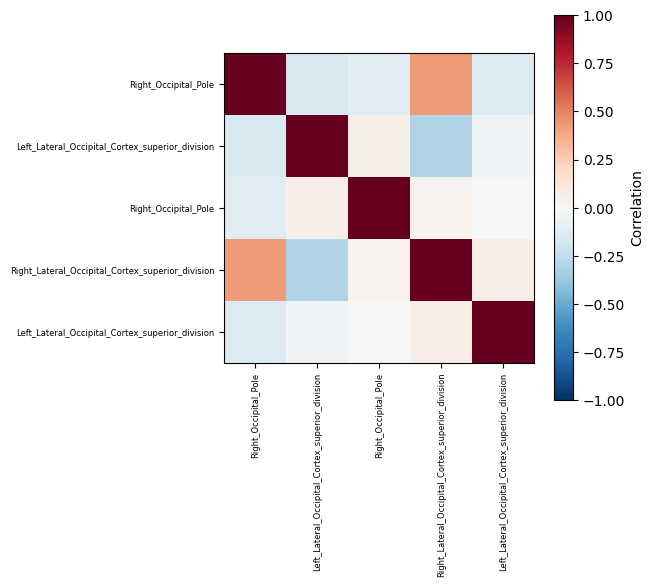

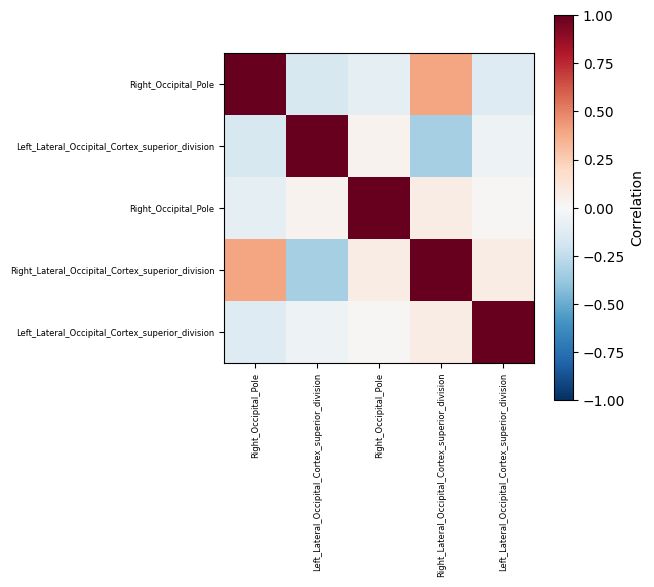

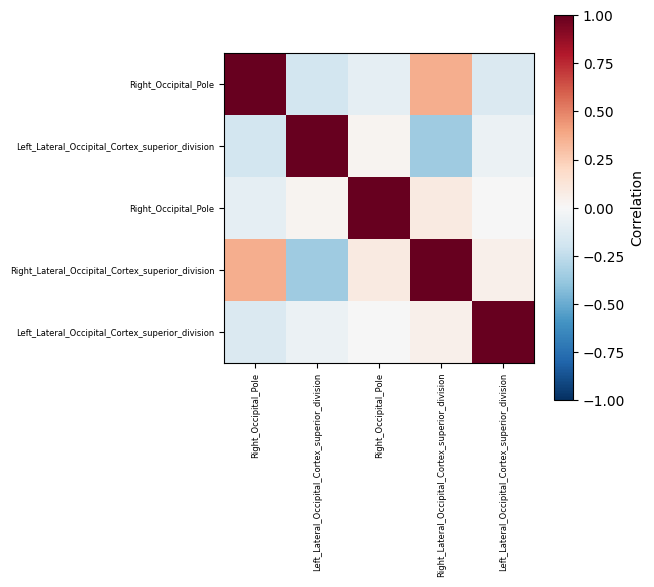

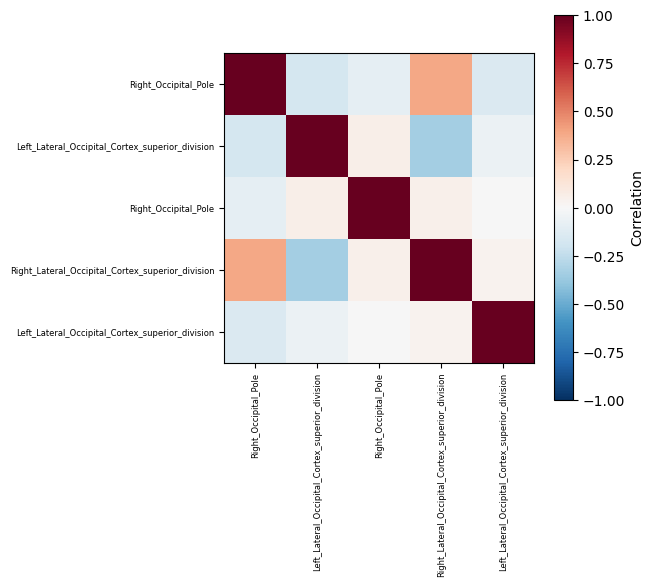

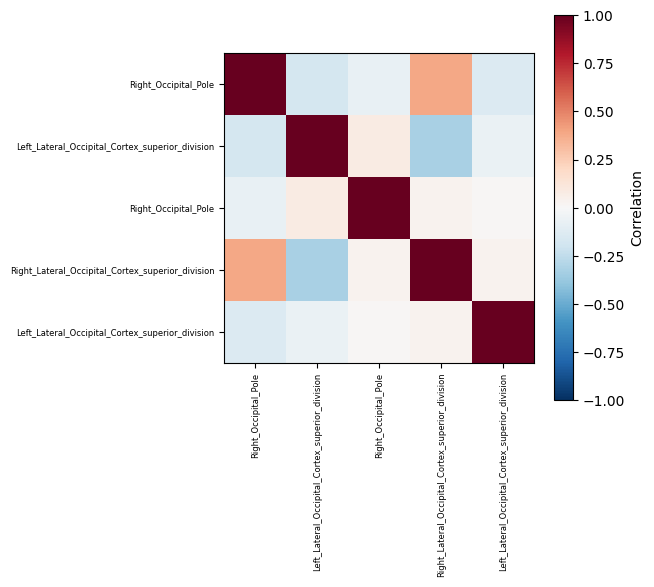

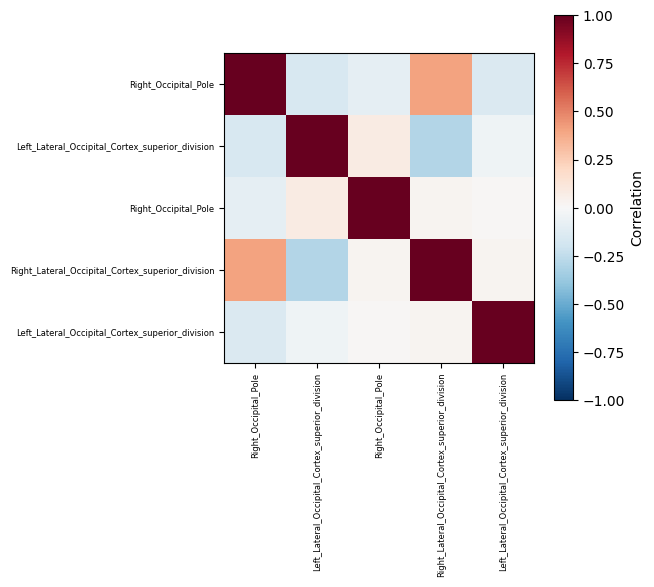

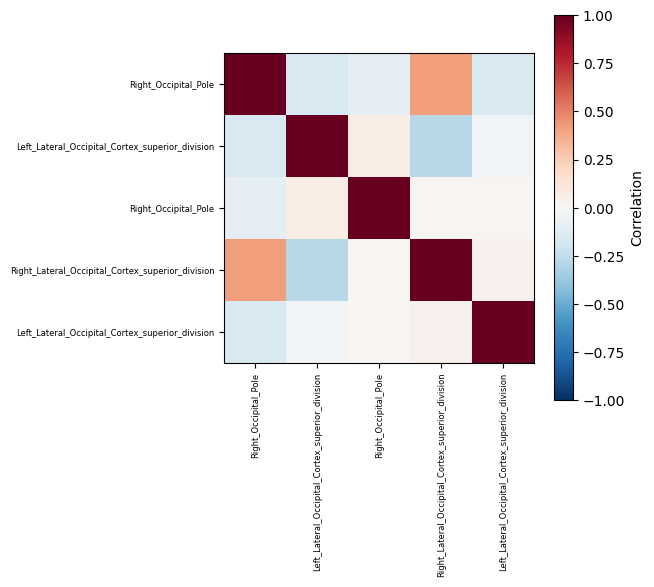

In [36]:
dat = all_data
average_corr_matrices_slid_all_5 = sliding_window_corr(dat, region=[0, 5])
average_corr_matrices_slid_5 = average_corr_matrices_slid_all_5[0]
ranged_brain_region_5 = average_corr_matrices_slid_all_5[1]

In [37]:
#setup for the region index
brain_region_index = [f"Region {i+1}" for i in range(len(average_corr_matrices_slid_5[0]))]
#create basic figure and the first plot
fig = go.Figure(
    data=go.Heatmap(
        z=average_corr_matrices_slid_5[0], 
        x=brain_region_index,
        y=brain_region_index,
        colorscale="RdBu_r",
        zmin=-1,
        zmax=1,
        colorbar=dict(title="Correlation", titleside="right", thickness=20)
    )
)
#construct following plots
frames = [
    go.Frame(
        data=go.Heatmap(
            z=matrix,
            x=brain_region_index,
            y=brain_region_index,
            colorscale="RdBu_r",
            zmin=-1,
            zmax=1
        ),
        name=f"Window {i+1}"
    )
    for i, matrix in enumerate(average_corr_matrices_slid)
]

fig.frames = frames
#setup for the layout
fig.update_layout(
    title=f"Brain Connectivity Over Time ({len(average_corr_matrices_slid_5[0])} x {len(average_corr_matrices_slid_5[0])} Matrix)",
    xaxis_title="Brain Region",
    yaxis_title="Brain Region",
    xaxis_nticks=len(brain_region),
    yaxis_nticks=len(brain_region),
    width=700,
    height=700,
    font=dict(size=10), 
    updatemenus=[
        {
            "type": "buttons",
            "showactive": False,
            "buttons": [
                {
                    "label": "Play",
                    "method": "animate",
                    "args": [None, {"frame": {"duration": 500, "redraw": True}, "fromcurrent": True}]
                },
                {
                    "label": "Pause",
                    "method": "animate",
                    "args": [[None], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}]
                }
            ]
        }
    ],
    sliders=[{
        "active": 0,
        "yanchor": "top",
        "xanchor": "left",
        "currentvalue": {"prefix": "Time Window: ", "font": {"size": 20}},
        "pad": {"b": 10, "t": 50},
        "len": 0.9,
        "x": 0.1,
        "y": 0,
        "steps": [
            {"args": [[f"Window {i+1}"], {"frame": {"duration": 300, "redraw": True}, "mode": "immediate"}],
             "label": f"{i+1}", "method": "animate"}
            for i in range(len(average_corr_matrices_slid_5))
        ]
    }]
)

fig.show()
print(ranged_brain_region_5)

['Right_Occipital_Pole', 'Left_Lateral_Occipital_Cortex_superior_division', 'Right_Occipital_Pole', 'Right_Lateral_Occipital_Cortex_superior_division', 'Left_Lateral_Occipital_Cortex_superior_division']


### Connectivity Across Brain Regions
After seeing the data and matrices, we decided to learn some method of analysis from the plot or image of the brain

In [43]:
def sliding_windows(data, num_windows, create_figure=False):
    len_window = 4800//num_windows
    window_matrices = []
    if create_figure:
        fig, axs = plt.subplots(num_windows//4, 4, figsize=(15, 10))
    for i in np.arange(0, num_windows):
        row = i//4
        col = i % 4
        i = int(i*len_window//2)
        lil_data = data[i: i + len_window]
        sub_corr_matrix = np.corrcoef(lil_data.T)
        window_matrices.append(sub_corr_matrix) 
        if create_figure:
            img = axs[row][col].imshow(sub_corr_matrix, cmap="RdBu_r",vmin=-1, vmax=1, interpolation="none")

    if create_figure:
        fig.colorbar(img, ax=axs, orientation='vertical', fraction=0.02, pad=0.04, shrink = 0.4)
    return window_matrices

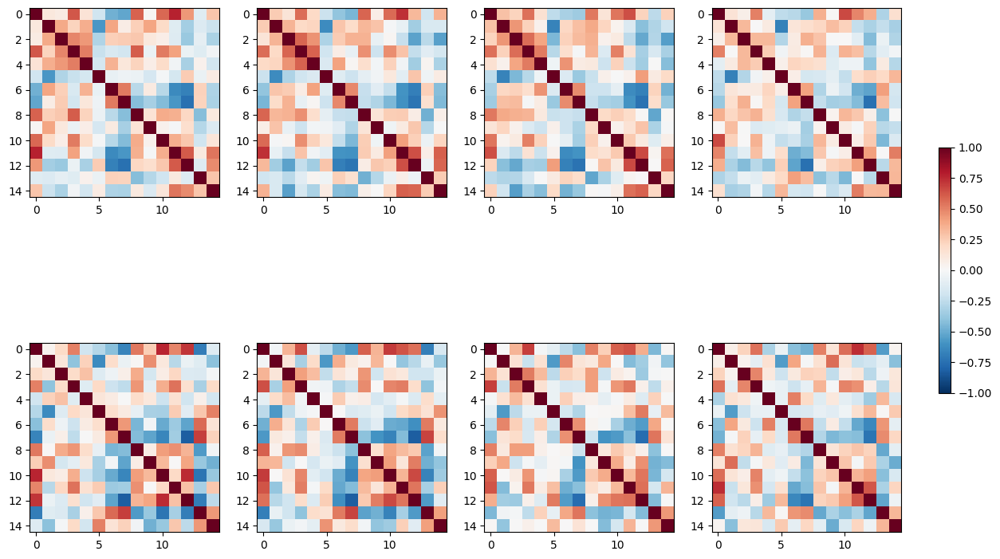

In [44]:
num_windows = 8
data = sub_data[847]
windows8 = sliding_windows(data, num_windows, True)

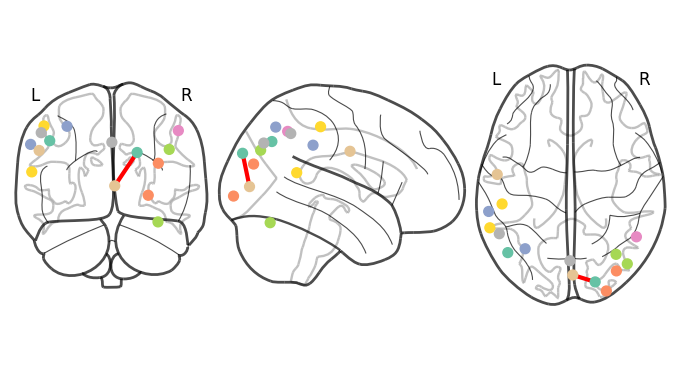

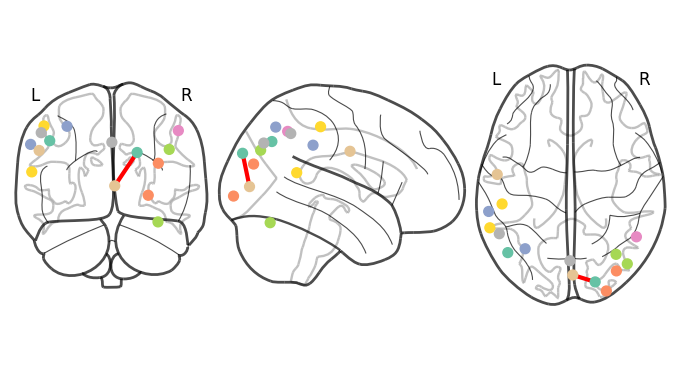

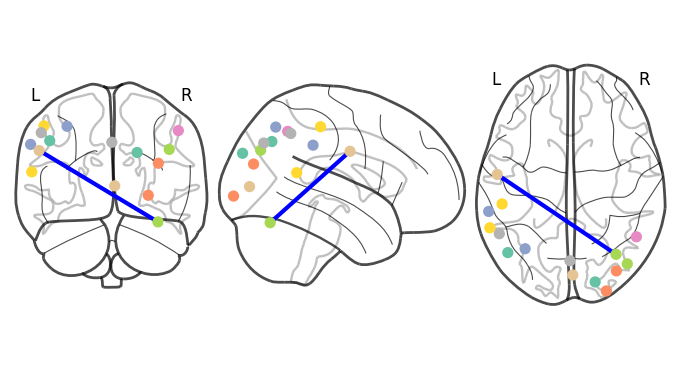

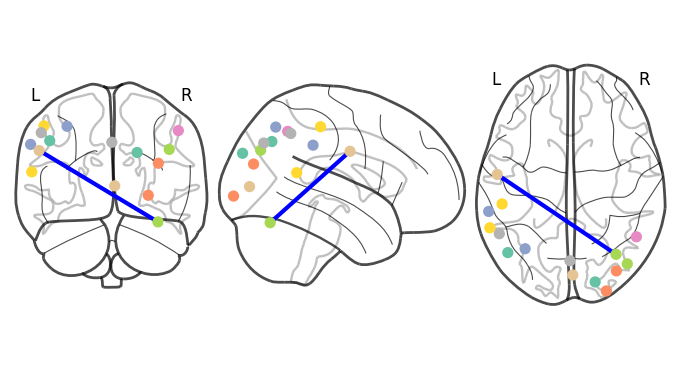

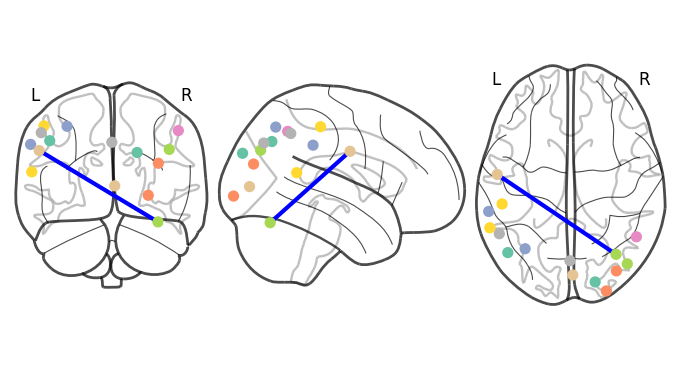

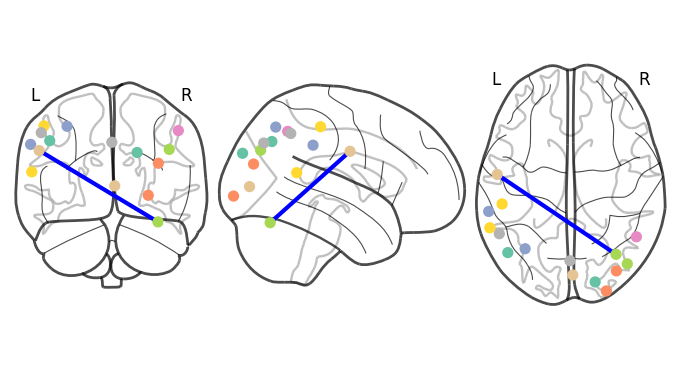

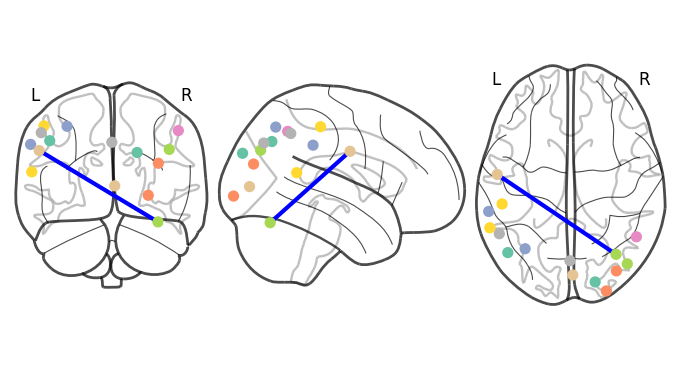

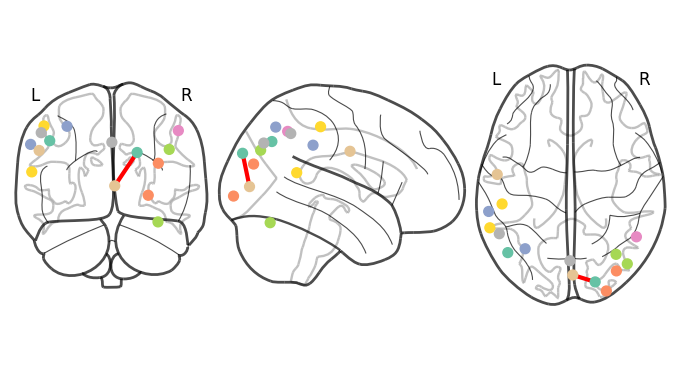

In [45]:
for each_window in windows8:
    plotting.plot_connectome(each_window, atlas_coords, edge_threshold="99.9%")

Seeing those connections plot by plot is not appearant for analysis, so we made another interactive plot in html which allows us to see the strength of the correlation, also we can see from each side of the brain and see the changes. This interactive plot allows us more freedom to see the brain. 

In [46]:
#interactive brain plot for the 1st sliding window
plotting.view_connectome(windows8[0], atlas_coords, title = "1st Sliding Window")

In [47]:
#interactive brain plot for the 2nd sliding window
plotting.view_connectome(windows8[7], atlas_coords, title = "8th Sliding Window")

## Correlation Plots across Time Windows

In [52]:
def get_data_over_time(matrices, x, y):
    '''
    Get data over time for a specific region 
    Columns:
    x - Time Windows
    y - Correlations
    group - Pair of regions
    '''
    data = np.array(matrices)[:, x, y]
    data = pd.DataFrame({
        'x': np.arange(1, len(data) + 1),  # Generate x-axis values: Time Windows 
        'y': data, # y-axis values: Correlations
        'group':[f'({x},{y})']*len(data) # Pair of regions
    })
    return data
    
def plot_correlations_over_time(data, title):
    ''' 
    Plot the correlation over time for a specific region
    '''
    chart = alt.Chart(data).mark_line().encode(
    x=alt.X('x', title='Time Window'),
    y=alt.Y('y', title = 'Correlation'),
    color='group',
    tooltip=['group'],
    ).properties(title=f'{title}', )
    return chart

In [64]:
charts = {}
plot_data = {}
for mat in windows8:
    top_correlations = percentile(mat).keys()
    indices = list(zip(*np.triu_indices(brain_r, 1)))
    for x,y in indices: 
        data_chart = get_data_over_time(windows8, x, y)
        chart = plot_correlations_over_time(data_chart, 'all correlations over 8 time windows')
        charts[(x, y)] = chart

In [65]:
combined_chart = alt.layer(*charts.values()).interactive()
combined_chart


alt.LayerChart(...)

In [66]:
charts = {}
plot_data = {}
for mat in windows8:
    top_correlations = percentile(mat).keys()
    for x,y in top_correlations: 
        data_chart = get_data_over_time(windows8, x, y)
        chart = plot_correlations_over_time(data_chart, 'top correlations over 8 time windows')
        charts[(x, y)] = chart

In [67]:
combined_chart = alt.layer(*charts.values()).interactive()
combined_chart

alt.LayerChart(...)

This chart shows the 99.9th percentile correlations, meaning the highest correlations across the 8 time windows and how they vary.

Some lines vary a lot while others vary less over time. I decided to plot the distribution of the standard deviation of all pair of points.

In [68]:
indices = list(zip(*np.triu_indices(brain_r, 1)))
point_dct = {}
for x,y in indices: 
    data_chart = np.array(windows8)[:, x, y]
    point_dct[(x, y)] = np.std(data_chart)

In [69]:
df = pd.DataFrame({'std': list(point_dct.values())}, index = np.arange(len(point_dct.keys())))

In [70]:
#This is a distribution of standard deviations of correlation across 12 windows across pairs
alt.Chart(df).mark_bar().encode(
    alt.X('std:Q', bin=True),
    alt.Y('count()')
).properties(title='distribution of standard deviation over of all correlations')

alt.Chart(...)

### find the map with one region vs all other regions

As we have some understandings with the whole brain and all regions, we want to go deeper into how a single region can have correlated with other regions and to see how other regions are paired with this specific region.

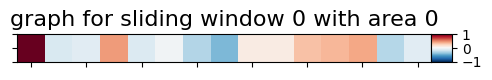

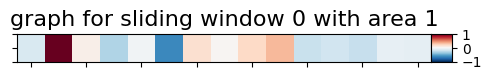

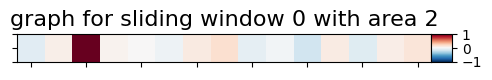

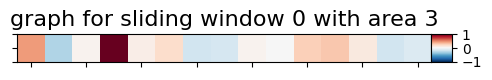

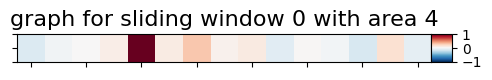

...

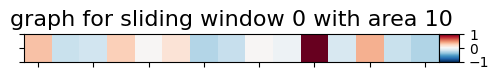

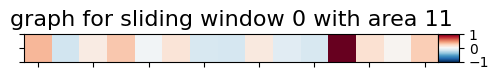

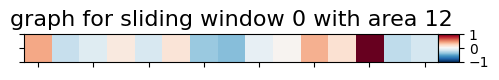

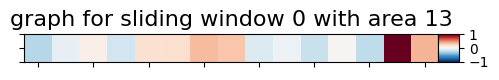

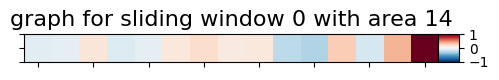

In [71]:
#looping through the sliding correlation matrix
for i in average_corr_matrices_slid:
    count = 0
    #looping in the 15 regions
    for j in range(15):
        plotting.plot_matrix(i[j].reshape(1,15), title = f"graph for sliding window {count} with area {j}", 
        cmap = "RdBu_r", figure = (5, 10), vmin=-1, vmax=1);   
    count += 1
    break

## Distribution of Correlation by Distance in the Brain

In [73]:
#distirbution of distances
dist = []
indices = np.triu_indices(brain_r, 1)
for i, j in zip(*indices):
    dist.append(distance_between_coords(i, j))
df = pd.DataFrame({'dist':dist})
df.shape

(105, 1)

In [74]:
#This is a distribution of all distance pairs excluding the diagonal
alt.Chart(df).mark_bar().encode(
    alt.X('dist:Q', bin=True),
    alt.Y('count()')
).properties(title='distribution of dist between 100 regions')

alt.Chart(...)

In [75]:
#-1 is the left hemisphere, 1 is the right hemisphere, 0 is the middle
assign_hemisphere = lambda x: -1 if x[0] < 0 else 1 if x[0] > 0 else 0

#adding columns for x and y hemisphere
def add_hemisphere(df):
    df['x_hemisphere'] = df['x'].apply(lambda x: 1 if atlas_coords[int(x)][0] > 0 else -1 if atlas_coords[int(x)][0] < 0 else 0)
    df['y_hemisphere'] = df['y'].apply(lambda x: 1 if atlas_coords[int(x)][0] > 0 else -1 if atlas_coords[int(x)][0] < 0 else 0)
    #same or different hemisphere
    df['same_hemisphere'] = df['x_hemisphere'] == df['y_hemisphere']
    return df

In [76]:
def data_df(corr_mats, indices, top_correlations=False):
    distances = []
    # df = pd.DataFrame({'x':[], 'y': [], 'cor':[], 'dist':[]})
    rows = []
    for mat in corr_mats:
        if top_correlations:
            top_correlations = percentile(mat, 99.9)
            top_correlations_id = top_correlations.keys()
            indices = top_correlations_id
        for x,y in indices:
            distance = distance_between_coords(x, y)
            distances.append(distance)
            rows.append({'x': x, 'y': y, 'cor': mat[x][y], 'dist': distance})
    df = pd.DataFrame(rows)
    return df

In [77]:
def plot_correlation_vs_distance(df, threshold=-1):
    sample = df[df['cor'] > threshold]
    plt.scatter(x=sample['dist'], y=sample['cor'], c=sample['same_hemisphere'], cmap='coolwarm')
    plt.title('Correlation vs Distance')
    plt.xlabel('Distance between two points (mm)')
    plt.ylabel('Correlation between two points')

    legend_labels = ['Different Hemisphere', 'Same Hemisphere']
    coolwarm = plt.colormaps['coolwarm']
    colors =  [coolwarm(0), coolwarm(300)]
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) for color in colors]
    legend = plt.legend(handles, legend_labels, title='Hemisphere', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.show()

In [79]:
df = data_df(windows8, list(zip(*indices)))

Text(0.5, 1.0, 'Distance vs. Correlation Plot')

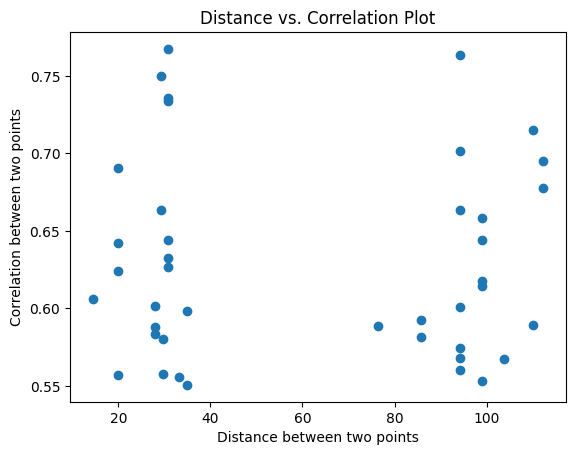

In [80]:
threshold = 0.55
sample = df[df['cor'] > threshold]
plt.scatter(x=sample['dist'], y=sample['cor'])
plt.xlabel('Distance between two points')
plt.ylabel('Correlation between two points')
plt.title("Distance vs. Correlation Plot")

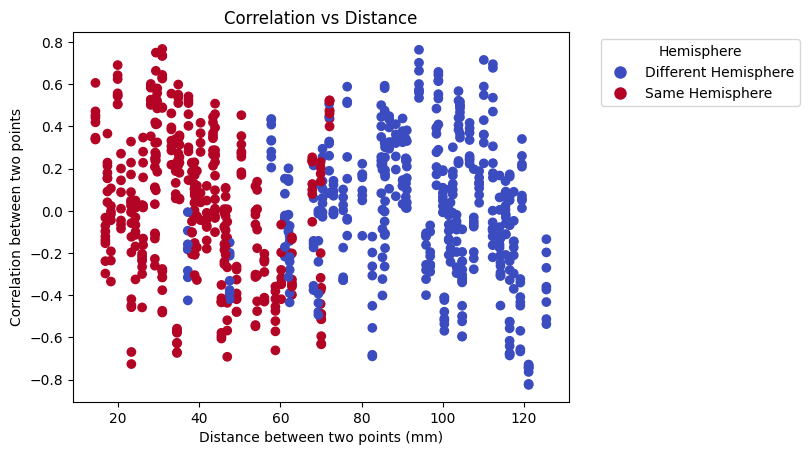

In [82]:
df = add_hemisphere(df)
plot_correlation_vs_distance(df)


## PCA

In [96]:
corr_matrix = np.sum(data, axis=0) / len(data)

# Compute the eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eig(corr_matrix)

# Sort the eigenvalues in descending order and get the indices
sorted_indices = np.argsort(eigenvalues)[::-1]
sorted_eigenvalues = eigenvalues[sorted_indices]

# Sort the eigenvectors according to the sorted indices
sorted_eigenvectors = eigenvectors[:, sorted_indices]

# Get the top k eigenvectors (e.g., top 2)
k = 10
top_eigenvectors = sorted_eigenvectors[:, :k]

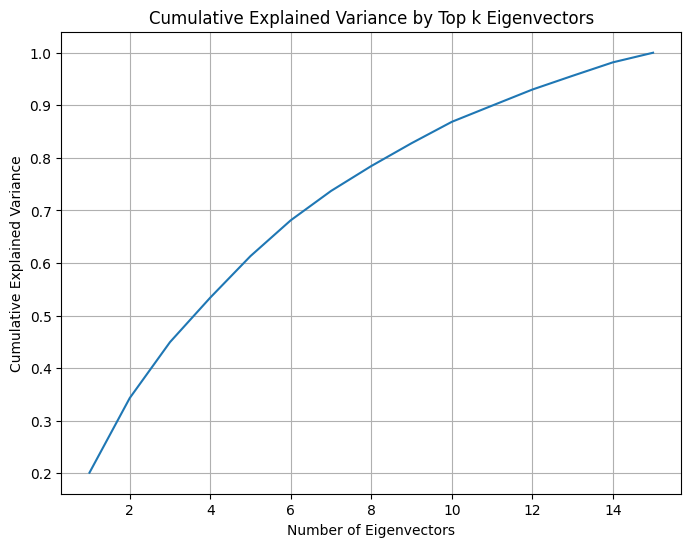

In [97]:
# Compute the explained variance for each eigenvalue
explained_variance = sorted_eigenvalues / np.sum(sorted_eigenvalues)

# Compute the cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance)

# Plot the cumulative explained variance
k = brain_r  # Number of top eigenvectors to consider
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, k+1), cumulative_explained_variance[:k])
plt.xlabel('Number of Eigenvectors')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Top k Eigenvectors')
plt.grid(True)
plt.show()

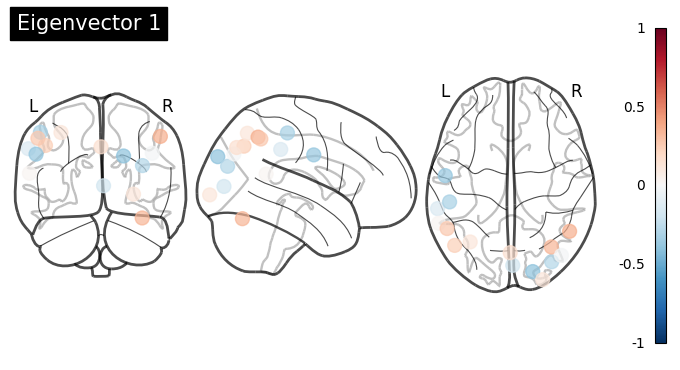

Right_Angular_Gyrus                                 0.36
Right_Occipital_Fusiform_Gyrus                      0.34
Left_Angular_Gyrus                                  0.27
Left_Lateral_Occipital_Cortex_superior_division     0.24
Left_Precuneous_Cortex                              0.16
Right_Occipital_Pole                                0.12
Left_Lateral_Occipital_Cortex_superior_division     0.12
Left_Supramarginal_Gyrus_posterior_division         0.02
Right_Lateral_Occipital_Cortex_superior_division   -0.02
Left_Supramarginal_Gyrus_anterior_division         -0.15
Right_Supracalcarine_Cortex                        -0.19
Right_Lateral_Occipital_Cortex_superior_division   -0.29
Left_Postcentral_Gyrus                             -0.33
Left_Precentral_Gyrus                              -0.39
Right_Occipital_Pole                               -0.41
Name: 1, dtype: float64


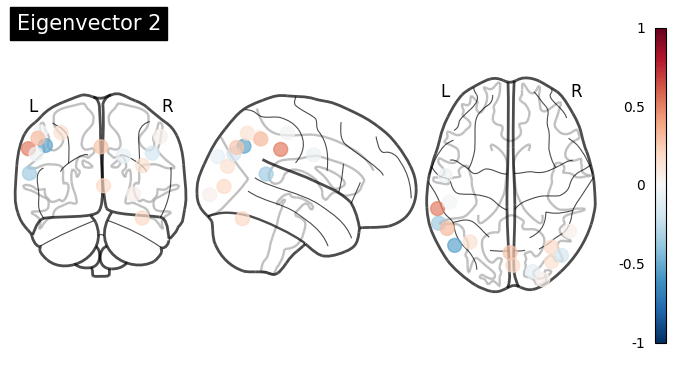

Left_Supramarginal_Gyrus_anterior_division          0.51
Left_Angular_Gyrus                                  0.31
Left_Precuneous_Cortex                              0.28
Right_Occipital_Fusiform_Gyrus                      0.20
Right_Supracalcarine_Cortex                         0.20
Right_Lateral_Occipital_Cortex_superior_division    0.15
Left_Lateral_Occipital_Cortex_superior_division     0.15
Right_Occipital_Pole                                0.06
Right_Angular_Gyrus                                 0.05
Left_Postcentral_Gyrus                             -0.02
Left_Precentral_Gyrus                              -0.04
Right_Occipital_Pole                               -0.08
Right_Lateral_Occipital_Cortex_superior_division   -0.17
Left_Supramarginal_Gyrus_posterior_division        -0.35
Left_Lateral_Occipital_Cortex_superior_division    -0.53
Name: 2, dtype: float64


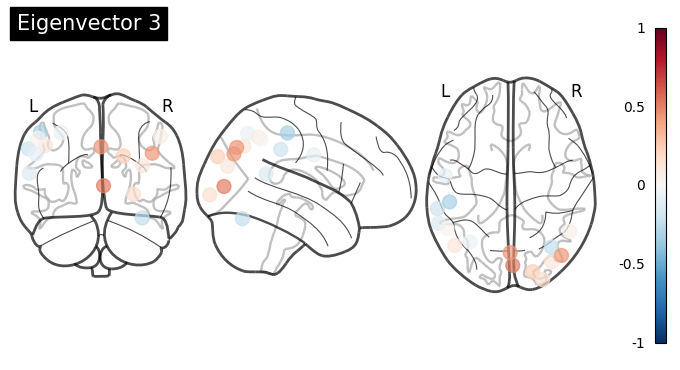

Right_Supracalcarine_Cortex                         0.51
Left_Precuneous_Cortex                              0.44
Right_Lateral_Occipital_Cortex_superior_division    0.43
Right_Occipital_Pole                                0.24
Right_Occipital_Pole                                0.16
Left_Lateral_Occipital_Cortex_superior_division     0.12
Right_Lateral_Occipital_Cortex_superior_division    0.11
Right_Angular_Gyrus                                 0.07
Left_Angular_Gyrus                                  0.03
Left_Lateral_Occipital_Cortex_superior_division    -0.06
Left_Precentral_Gyrus                              -0.08
Left_Supramarginal_Gyrus_posterior_division        -0.13
Left_Supramarginal_Gyrus_anterior_division         -0.21
Right_Occipital_Fusiform_Gyrus                     -0.24
Left_Postcentral_Gyrus                             -0.33
Name: 3, dtype: float64


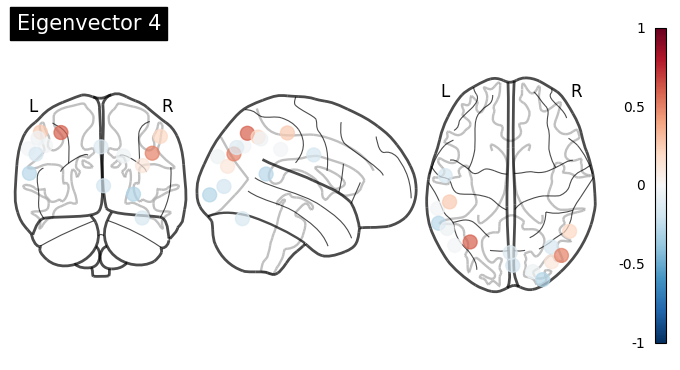

Left_Lateral_Occipital_Cortex_superior_division     0.60
Right_Lateral_Occipital_Cortex_superior_division    0.50
Left_Postcentral_Gyrus                              0.26
Right_Angular_Gyrus                                 0.21
Right_Lateral_Occipital_Cortex_superior_division    0.12
Left_Lateral_Occipital_Cortex_superior_division    -0.02
Left_Supramarginal_Gyrus_anterior_division         -0.02
Right_Occipital_Pole                               -0.04
Left_Angular_Gyrus                                 -0.04
Left_Precuneous_Cortex                             -0.14
Right_Occipital_Fusiform_Gyrus                     -0.16
Left_Precentral_Gyrus                              -0.17
Right_Supracalcarine_Cortex                        -0.18
Left_Supramarginal_Gyrus_posterior_division        -0.28
Right_Occipital_Pole                               -0.29
Name: 4, dtype: float64


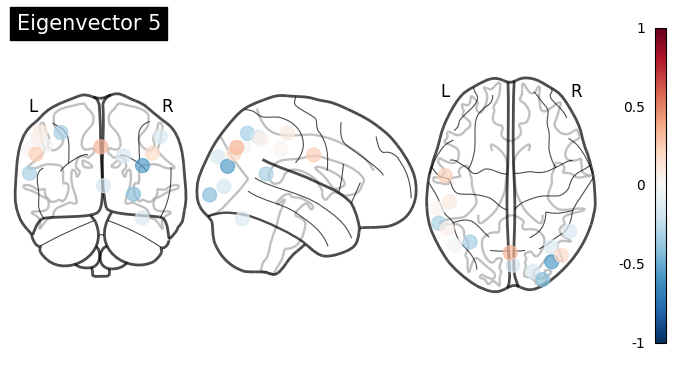

Left_Precuneous_Cortex                              0.33
Left_Precentral_Gyrus                               0.24
Right_Lateral_Occipital_Cortex_superior_division    0.18
Left_Postcentral_Gyrus                              0.09
Left_Angular_Gyrus                                  0.06
Left_Supramarginal_Gyrus_anterior_division          0.02
Left_Lateral_Occipital_Cortex_superior_division    -0.03
Right_Occipital_Fusiform_Gyrus                     -0.14
Right_Angular_Gyrus                                -0.15
Right_Occipital_Pole                               -0.16
Right_Supracalcarine_Cortex                        -0.17
Left_Supramarginal_Gyrus_posterior_division        -0.32
Left_Lateral_Occipital_Cortex_superior_division    -0.33
Right_Occipital_Pole                               -0.42
Right_Lateral_Occipital_Cortex_superior_division   -0.55
Name: 5, dtype: float64


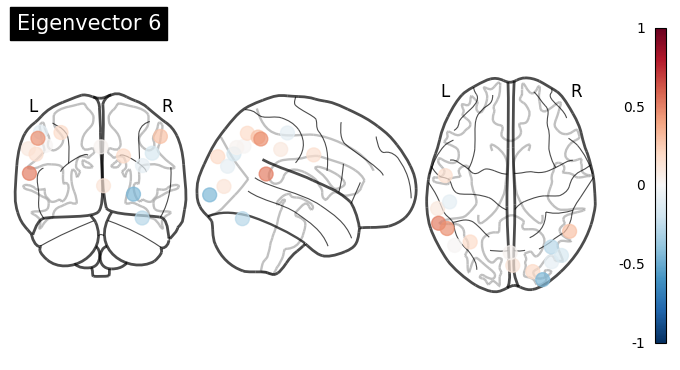

Left_Supramarginal_Gyrus_posterior_division         0.51
Left_Angular_Gyrus                                  0.46
Right_Angular_Gyrus                                 0.29
Right_Occipital_Pole                                0.19
Left_Lateral_Occipital_Cortex_superior_division     0.18
Left_Precentral_Gyrus                               0.16
Right_Supracalcarine_Cortex                         0.13
Left_Supramarginal_Gyrus_anterior_division          0.10
Left_Precuneous_Cortex                              0.03
Left_Lateral_Occipital_Cortex_superior_division     0.01
Right_Lateral_Occipital_Cortex_superior_division   -0.09
Left_Postcentral_Gyrus                             -0.10
Right_Lateral_Occipital_Cortex_superior_division   -0.16
Right_Occipital_Fusiform_Gyrus                     -0.28
Right_Occipital_Pole                               -0.45
Name: 6, dtype: float64


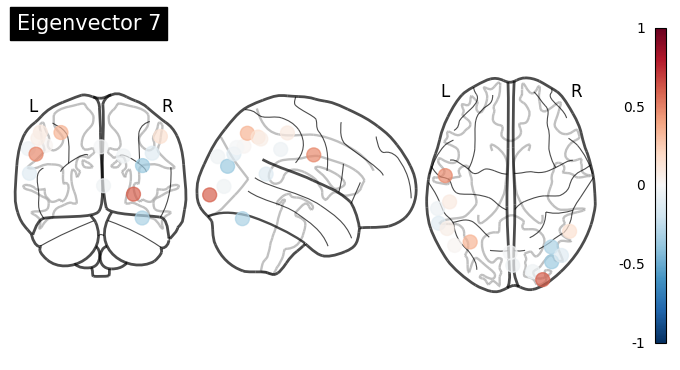

Right_Occipital_Pole                                0.60
Left_Precentral_Gyrus                               0.48
Left_Lateral_Occipital_Cortex_superior_division     0.34
Right_Angular_Gyrus                                 0.15
Left_Postcentral_Gyrus                              0.09
Left_Angular_Gyrus                                  0.07
Left_Lateral_Occipital_Cortex_superior_division     0.02
Left_Precuneous_Cortex                             -0.01
Right_Occipital_Pole                               -0.04
Right_Supracalcarine_Cortex                        -0.04
Left_Supramarginal_Gyrus_anterior_division         -0.05
Right_Lateral_Occipital_Cortex_superior_division   -0.12
Left_Supramarginal_Gyrus_posterior_division        -0.12
Right_Occipital_Fusiform_Gyrus                     -0.32
Right_Lateral_Occipital_Cortex_superior_division   -0.36
Name: 7, dtype: float64


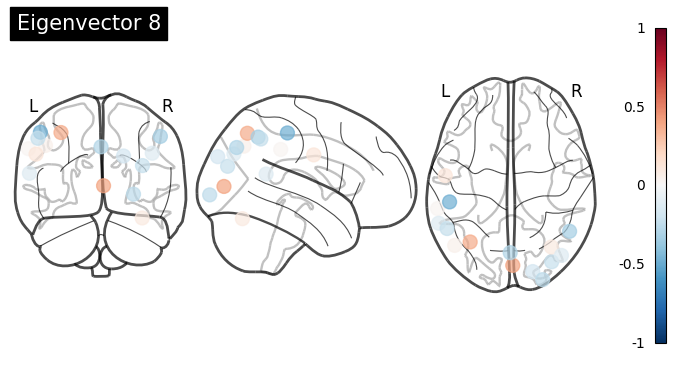

Right_Supracalcarine_Cortex                         0.40
Left_Lateral_Occipital_Cortex_superior_division     0.37
Left_Precentral_Gyrus                               0.12
Right_Occipital_Fusiform_Gyrus                      0.09
Left_Lateral_Occipital_Cortex_superior_division     0.05
Left_Supramarginal_Gyrus_anterior_division          0.02
Right_Lateral_Occipital_Cortex_superior_division   -0.13
Left_Supramarginal_Gyrus_posterior_division        -0.13
Right_Occipital_Pole                               -0.18
Right_Lateral_Occipital_Cortex_superior_division   -0.23
Left_Angular_Gyrus                                 -0.24
Right_Occipital_Pole                               -0.26
Left_Precuneous_Cortex                             -0.30
Right_Angular_Gyrus                                -0.34
Left_Postcentral_Gyrus                             -0.49
Name: 8, dtype: float64


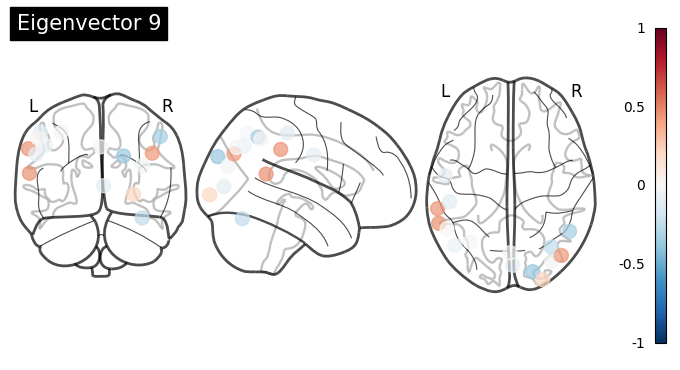

Left_Supramarginal_Gyrus_posterior_division         0.46
Left_Supramarginal_Gyrus_anterior_division          0.45
Right_Lateral_Occipital_Cortex_superior_division    0.43
Right_Occipital_Pole                                0.21
Left_Angular_Gyrus                                  0.02
Left_Precuneous_Cortex                              0.00
Left_Lateral_Occipital_Cortex_superior_division    -0.01
Right_Lateral_Occipital_Cortex_superior_division   -0.02
Left_Lateral_Occipital_Cortex_superior_division    -0.07
Left_Precentral_Gyrus                              -0.09
Right_Supracalcarine_Cortex                        -0.10
Left_Postcentral_Gyrus                             -0.11
Right_Occipital_Fusiform_Gyrus                     -0.25
Right_Angular_Gyrus                                -0.34
Right_Occipital_Pole                               -0.38
Name: 9, dtype: float64


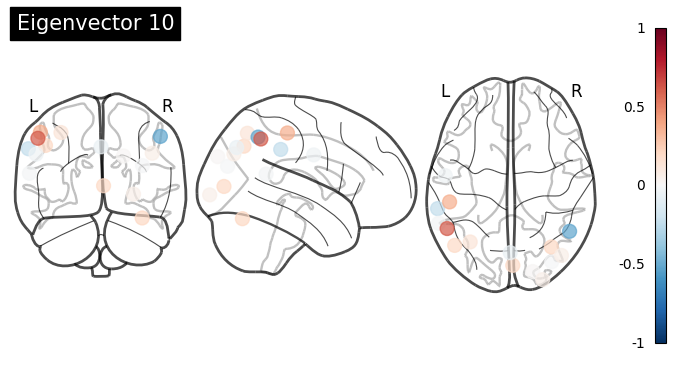

Left_Angular_Gyrus                                  0.61
Left_Postcentral_Gyrus                              0.36
Right_Occipital_Fusiform_Gyrus                      0.21
Left_Lateral_Occipital_Cortex_superior_division     0.20
Right_Supracalcarine_Cortex                         0.20
Left_Lateral_Occipital_Cortex_superior_division     0.13
Right_Lateral_Occipital_Cortex_superior_division    0.07
Right_Occipital_Pole                                0.06
Right_Occipital_Pole                                0.01
Right_Lateral_Occipital_Cortex_superior_division   -0.01
Left_Supramarginal_Gyrus_posterior_division        -0.02
Left_Precentral_Gyrus                              -0.04
Left_Precuneous_Cortex                             -0.07
Left_Supramarginal_Gyrus_anterior_division         -0.25
Right_Angular_Gyrus                                -0.53
Name: 10, dtype: float64


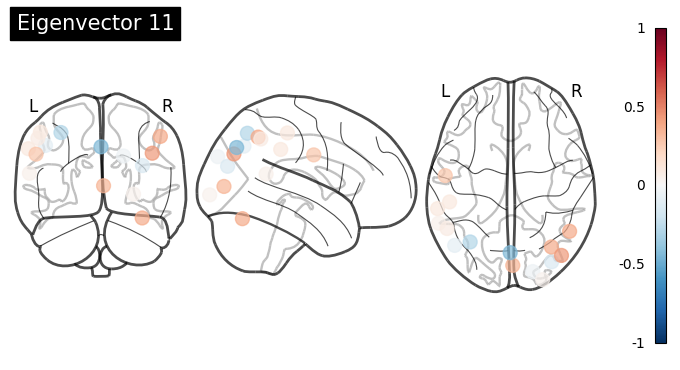

Right_Lateral_Occipital_Cortex_superior_division    0.43
Right_Angular_Gyrus                                 0.38
Right_Occipital_Fusiform_Gyrus                      0.37
Right_Supracalcarine_Cortex                         0.34
Left_Precentral_Gyrus                               0.28
Left_Supramarginal_Gyrus_anterior_division          0.10
Left_Postcentral_Gyrus                              0.10
Left_Angular_Gyrus                                  0.08
Left_Supramarginal_Gyrus_posterior_division         0.05
Right_Occipital_Pole                                0.04
Right_Occipital_Pole                               -0.05
Left_Lateral_Occipital_Cortex_superior_division    -0.10
Right_Lateral_Occipital_Cortex_superior_division   -0.15
Left_Lateral_Occipital_Cortex_superior_division    -0.29
Left_Precuneous_Cortex                             -0.45
Name: 11, dtype: float64


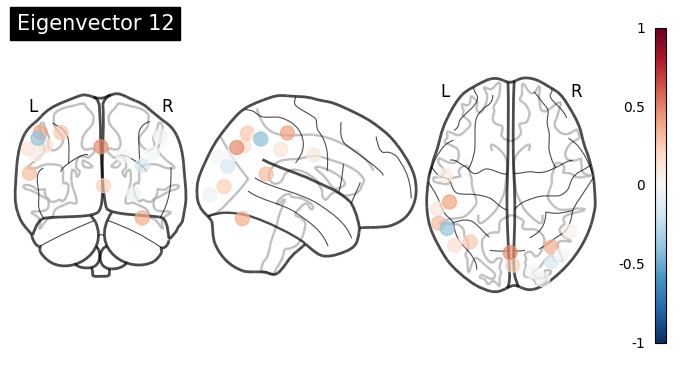

Left_Precuneous_Cortex                              0.47
Left_Postcentral_Gyrus                              0.41
Right_Occipital_Fusiform_Gyrus                      0.36
Left_Supramarginal_Gyrus_posterior_division         0.32
Left_Lateral_Occipital_Cortex_superior_division     0.27
Right_Supracalcarine_Cortex                         0.24
Left_Lateral_Occipital_Cortex_superior_division     0.17
Left_Supramarginal_Gyrus_anterior_division          0.13
Left_Precentral_Gyrus                               0.08
Right_Angular_Gyrus                                 0.04
Right_Occipital_Pole                               -0.01
Right_Lateral_Occipital_Cortex_superior_division   -0.01
Right_Occipital_Pole                               -0.04
Right_Lateral_Occipital_Cortex_superior_division   -0.16
Left_Angular_Gyrus                                 -0.40
Name: 12, dtype: float64


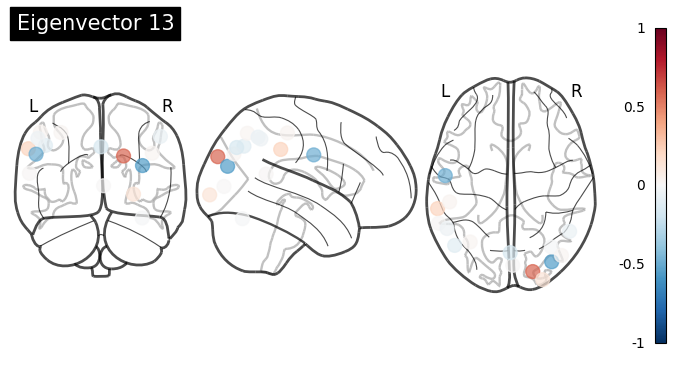

Right_Occipital_Pole                                0.58
Left_Supramarginal_Gyrus_anterior_division          0.22
Right_Occipital_Pole                                0.13
Left_Postcentral_Gyrus                              0.03
Left_Lateral_Occipital_Cortex_superior_division     0.02
Right_Lateral_Occipital_Cortex_superior_division    0.02
Left_Supramarginal_Gyrus_posterior_division         0.01
Right_Supracalcarine_Cortex                        -0.00
Right_Occipital_Fusiform_Gyrus                     -0.01
Left_Angular_Gyrus                                 -0.05
Right_Angular_Gyrus                                -0.07
Left_Lateral_Occipital_Cortex_superior_division    -0.11
Left_Precuneous_Cortex                             -0.16
Left_Precentral_Gyrus                              -0.49
Right_Lateral_Occipital_Cortex_superior_division   -0.56
Name: 13, dtype: float64


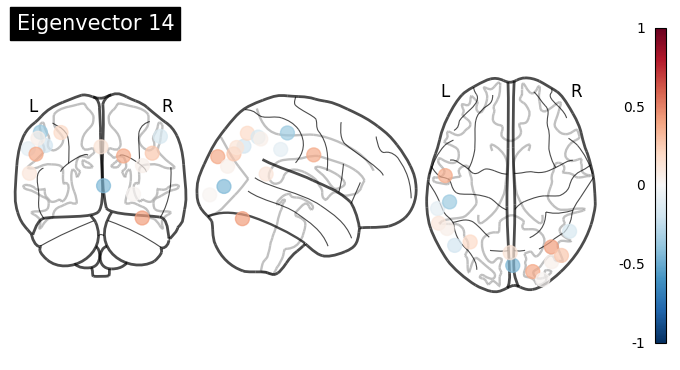

Right_Occipital_Fusiform_Gyrus                      0.42
Right_Occipital_Pole                                0.38
Left_Precentral_Gyrus                               0.37
Right_Lateral_Occipital_Cortex_superior_division    0.27
Left_Lateral_Occipital_Cortex_superior_division     0.19
Left_Precuneous_Cortex                              0.14
Left_Supramarginal_Gyrus_posterior_division         0.12
Left_Angular_Gyrus                                  0.06
Right_Lateral_Occipital_Cortex_superior_division    0.05
Right_Occipital_Pole                                0.02
Left_Supramarginal_Gyrus_anterior_division         -0.10
Right_Angular_Gyrus                                -0.16
Left_Lateral_Occipital_Cortex_superior_division    -0.18
Left_Postcentral_Gyrus                             -0.36
Right_Supracalcarine_Cortex                        -0.44
Name: 14, dtype: float64


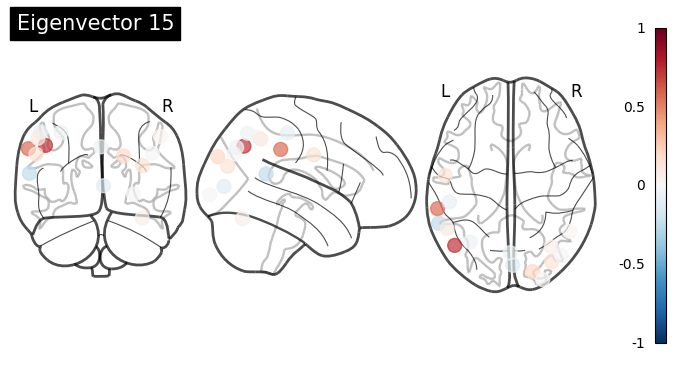

Left_Lateral_Occipital_Cortex_superior_division     0.72
Left_Supramarginal_Gyrus_anterior_division          0.56
Right_Occipital_Pole                                0.19
Right_Lateral_Occipital_Cortex_superior_division    0.14
Left_Precentral_Gyrus                               0.14
Left_Angular_Gyrus                                  0.08
Right_Occipital_Fusiform_Gyrus                      0.06
Right_Angular_Gyrus                                 0.02
Right_Occipital_Pole                               -0.00
Right_Lateral_Occipital_Cortex_superior_division    0.00
Left_Lateral_Occipital_Cortex_superior_division    -0.04
Left_Precuneous_Cortex                             -0.04
Left_Postcentral_Gyrus                             -0.08
Right_Supracalcarine_Cortex                        -0.11
Left_Supramarginal_Gyrus_posterior_division        -0.25
Name: 15, dtype: float64


In [98]:
df = pd.DataFrame(sorted_eigenvectors, index= brain_region, columns=np.arange(1, brain_r+1))
df = df.apply(lambda x: np.round(x, 2))

for i in range(1, brain_r+1):
    plotting.plot_markers(node_values=df[i], node_coords=atlas_coords, node_vmax=1, node_vmin=-1, node_cmap="RdBu_r", title=f'Eigenvector {i}')
    plt.show()
    print(df[i].sort_values(ascending=False))

Interpretation:

* The entries of an eigenvector indicate the relative contribution of each brain region to that specific pattern of variation.
* A higher eigenvalue means that the corresponding eigenvector accounts for a larger portion of the correlated variation in the brain regions.
* First egienvector represents more global correlation across all of the brain, and the following eigenvectors highlight specific subsets of brain regions.